In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import warnings

import pandas as pd
import numpy as np
import pandas_datareader.data as web

import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn')
sns.set_palette('cubehelix')
plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

#  Carimento dei Dati

In [223]:
start_date = '30-11-2011'
end_date = '30-11-2021'
stocks = ['JPM', 'BLK', 'XOM', 'CVX', 'AAPL', 'TSLA']
attributes = ['Adj Close', 'Close', 'Open', 'High', 'Low', 'Volume']
xle_path = './data/BATS_XLE, 1D_bb421.csv'
xlf_path = './data/BATS_XLF, 1D_e79b8.csv'
xlk_path = './data/BATS_XLK, 1D_d34c0.csv'
sp500_path = './data/CME_MINI_DL_ES1!, 1D_1996d.csv'

In [3]:
stocks_df = web.DataReader(stocks, 'yahoo', start_date, end_date)
xle_df = pd.read_csv(xle_path, sep=',', parse_dates=True)
xlk_df = pd.read_csv(xlk_path, sep=',', parse_dates=True)
xlf_df = pd.read_csv(xlf_path, sep=',', parse_dates=True)

In [4]:
xle_df['date'] = pd.to_datetime(xle_df['time']).apply(lambda x: x.date())
xle_df['date'] = pd.to_datetime(xle_df['date'], format='%Y-%m-%d')

xlk_df['date'] = pd.to_datetime(xlk_df['time']).apply(lambda x: x.date())
xlk_df['date'] = pd.to_datetime(xlk_df['date'], format='%Y-%m-%d')

xlf_df['date'] = pd.to_datetime(xlf_df['time']).apply(lambda x: x.date())
xlf_df['date'] = pd.to_datetime(xlf_df['date'], format='%Y-%m-%d')

In [5]:
xle_df.set_index('date', inplace=True)
xle_df.drop('time', axis=1, inplace=True)
xlk_df.set_index('date', inplace=True)
xlk_df.drop('time', axis=1, inplace=True)
xlf_df.set_index('date', inplace=True)
xlf_df.drop('time', axis=1, inplace=True)

In [6]:
xle_df = xle_df[start_date:end_date]
xlk_df = xlk_df[start_date:end_date]
xlf_df = xlf_df[start_date:end_date]


In [7]:
stocks_df.head()

Attributes  Adj Close                                                      \
Symbols           JPM         BLK        XOM        CVX       AAPL   TSLA   
Date                                                                        
2011-11-30  23.506088  132.182892  53.403606  68.145966  11.703035  6.548   
2011-12-01  23.119007  129.661835  52.972103  67.489815  11.878487  6.520   
2011-12-02  24.538326  130.908783  52.972103  67.397026  11.932685  6.660   
2011-12-05  25.433933  136.554977  53.410278  68.145966  12.034037  6.884   
2011-12-06  25.221420  134.347626  53.655910  69.166618  11.970959  6.974   

Attributes      Close                                     ...       Open  \
Symbols           JPM         BLK        XOM         CVX  ...        XOM   
Date                                                      ...              
2011-11-30  30.969999  172.039993  80.440002  102.820000  ...  78.419998   
2011-12-01  30.459999  167.410004  79.790001  101.830002  ...  80.199997   
2011-12-02  32.330002  169.020004  79.790001  101.690002  ...  80.669998   
2011-12-05  33.509998  176.309998  80.449997  102.820000  ...  80.879997   
2011-12-06  33.230000  173.460007  80.820000  104.360001  ...  80.629997   

Attributes                                    Volume                         \
Symbols            CVX       AAPL   TSLA         JPM        BLK         XOM   
Date                                                                          
2011-11-30  100.500000  13.617500  6.500  61412600.0  1388200.0  33953000.0   
2011-12-01  102.820000  13.662143  6.514  33189700.0   752500.0  17261100.0   
2011-12-02  103.040001  13.922500  6.566  90515100.0   618200.0  19461300.0   
2011-12-05  103.580002  14.053214  6.706  52207600.0  1009300.0  18295000.0   
2011-12-06  103.099998  14.018214  6.840  38782900.0   530100.0  20122700.0   

Attributes                                      
Symbols            CVX         AAPL       TSLA  
Date                                            
2011-11-30  13373200.0  405938400.0  3801500.0  
2011-12-01   7007200.0  387181200.0  5151000.0  
2011-12-02   6638100.0  379055600.0  4014000.0  
2011-12-05   6121800.0  357210000.0  5800500.0  
2011-12-06   7445000.0  283598000.0  4759000.0  

[5 rows x 36 columns]

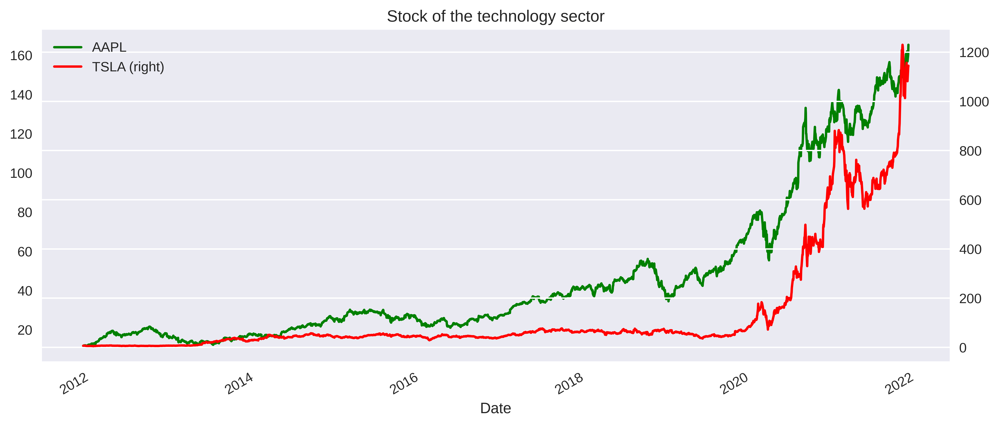

In [8]:
plt.figure(figsize=(12, 5))
plt.xlabel('Date')

ax1 = stocks_df['Adj Close'].loc[:, 'AAPL'].plot(color='green', label='AAPL', title='Stock of the technology sector')
ax2 = stocks_df['Adj Close'].loc[:, 'TSLA'].plot(color='red', secondary_y=True, label='TSLA')

h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()


plt.legend(h1+h2, l1+l2, loc=2)
plt.show()

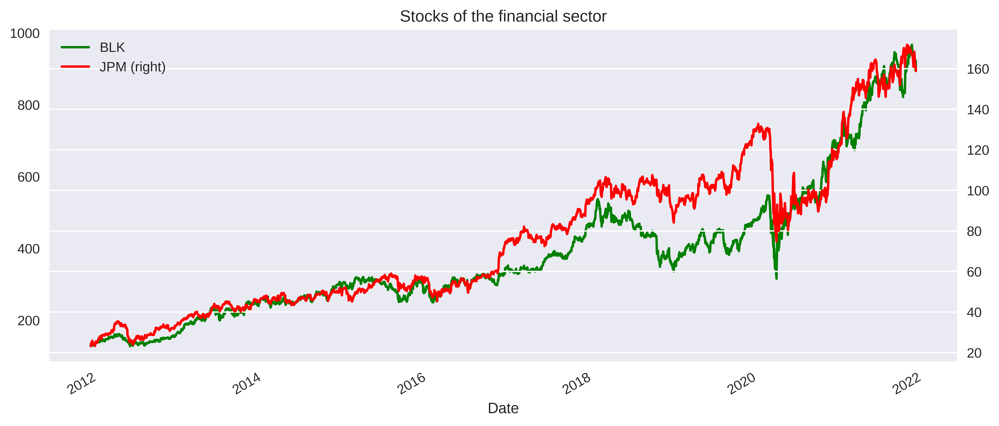

In [9]:
plt.figure(figsize=(12, 5))
plt.xlabel('Date')

ax1 = stocks_df['Adj Close'].loc[:, 'BLK'].plot(color='green', label='BLK', title='Stocks of the financial sector')
ax2 = stocks_df['Adj Close'].loc[:, 'JPM'].plot(color='red', secondary_y=True, label='JPM')

h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()


plt.legend(h1+h2, l1+l2, loc=2)
plt.show()

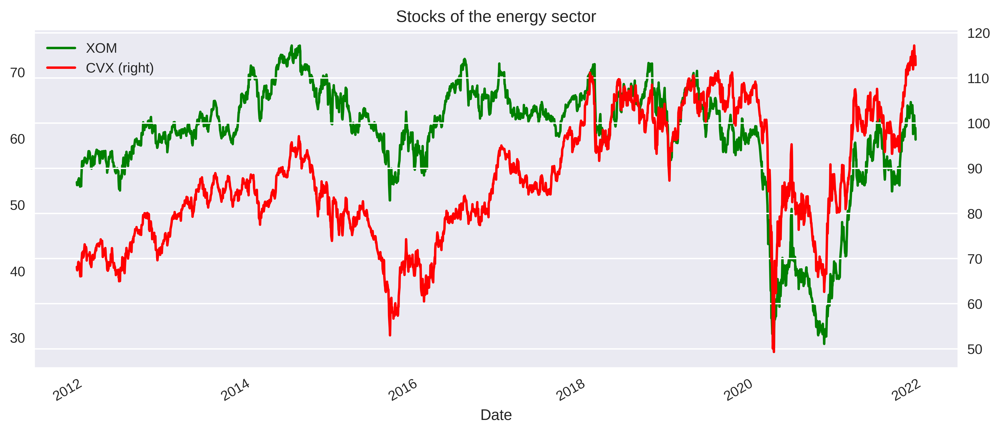

In [10]:
plt.figure(figsize=(12, 5))
plt.xlabel('Date')

ax1 = stocks_df['Adj Close'].loc[:, 'XOM'].plot(color='green', label='XOM', title='Stocks of the energy sector')
ax2 = stocks_df['Adj Close'].loc[:, 'CVX'].plot(color='red', secondary_y=True, label='CVX')

h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()


plt.legend(h1+h2, l1+l2, loc=2)
plt.show()

# Analisi Eslorativa

# Rendimenti Semplici e Composti

In [361]:
returns = stocks_df['Adj Close'].pct_change().dropna()
log_returns = np.log(stocks_df['Adj Close']/stocks_df['Adj Close'].shift(1)).dropna()

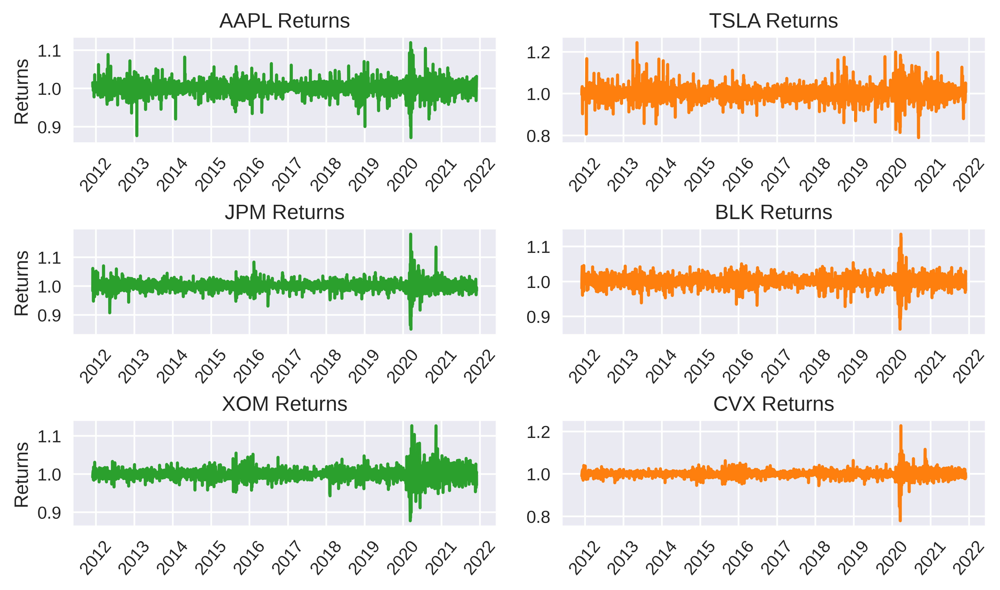

In [12]:
fig, axs = plt.subplots(3, 2)
fig.tight_layout(h_pad=3)

color_1 = 'tab:green'
color_2 = 'tab:orange'

axs[0, 0].set(ylabel='Returns',
       title='AAPL Returns')
axs[0, 0].plot(returns.loc[:, 'AAPL'], color=color_1)
axs[0, 0].tick_params(axis="x", rotation=50)
axs[0, 1].set(title='TSLA Returns')
axs[0, 1].plot(returns.loc[:, 'TSLA'], color=color_2)
axs[0, 1].tick_params(axis="x", rotation=50)

axs[1, 0].set(ylabel='Returns',
              title='JPM Returns')
axs[1, 0].plot(returns.loc[:, 'JPM'], color=color_1)
axs[1, 0].tick_params(axis="x", rotation=50)
axs[1, 1].set(title='BLK Returns')
axs[1, 1].plot(returns.loc[:, 'BLK'], color=color_2)
axs[1, 1].tick_params(axis="x", rotation=50)

axs[2, 0].set(ylabel='Returns',
              title='XOM Returns')
axs[2, 0].plot(returns.loc[:, 'XOM'], color=color_1)
axs[2, 0].tick_params(axis="x", rotation=50)
axs[2, 1].set(title='CVX Returns')
axs[2, 1].plot(returns.loc[:, 'CVX'], color=color_2)
axs[2, 1].tick_params(axis="x", rotation=50)

plt.show()

## Distribuzioni dei Ritorni Logaritmici

In [13]:
import scipy.stats as stats

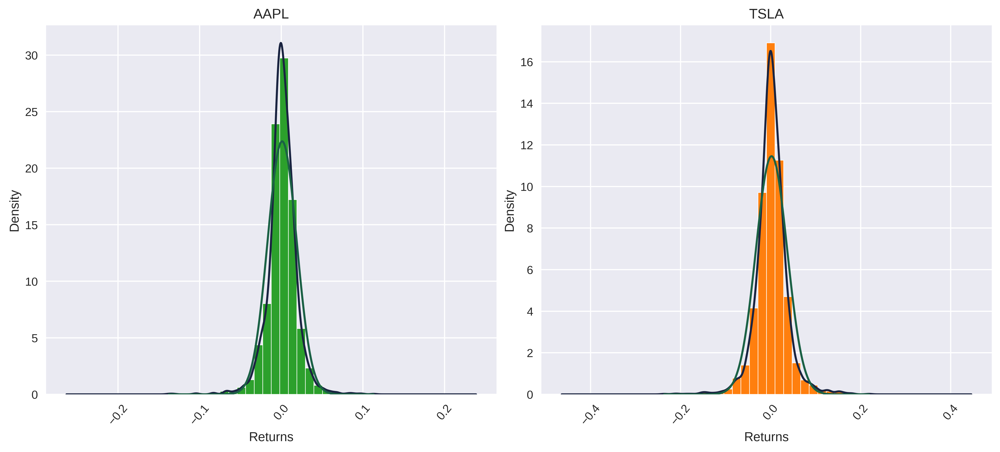

In [14]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
fig.tight_layout(h_pad=3)

color_1 = 'tab:green'
color_2 = 'tab:orange'

axs[0].set(xlabel='Returns',
              title='AAPL')
axs[0].hist(log_returns.loc[:, 'AAPL'], color=color_1, bins=24, linewidth=0.5, edgecolor="white", density=True)
log_returns.loc[:, 'AAPL'].plot.density(ax=axs[0])
h = sorted(log_returns.loc[:, 'AAPL'].values)
axs[0].plot(h,stats.norm.pdf(h, np.mean(h), np.std(h)))
axs[0].tick_params(axis="x", rotation=50)

axs[1].set(xlabel='Returns', title='TSLA')
axs[1].hist(log_returns.loc[:, 'TSLA'], color=color_2, bins=24, linewidth=0.5,edgecolor="white", density=True)
log_returns.loc[:, 'TSLA'].plot.density(ax=axs[1])
h = sorted(log_returns.loc[:, 'TSLA'].values)
axs[1].plot(h,stats.norm.pdf(h, np.mean(h), np.std(h)))
axs[1].tick_params(axis="x", rotation=50)

plt.show()

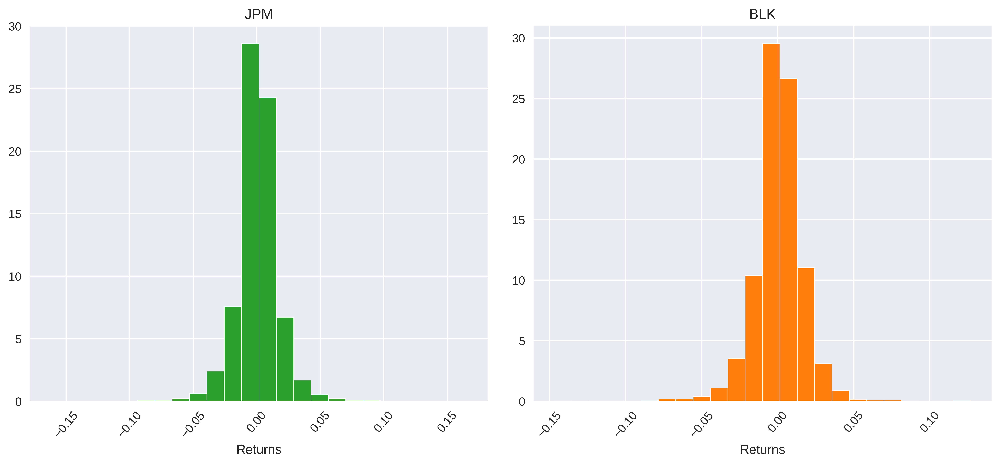

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
fig.tight_layout(h_pad=3)

color_1 = 'tab:green'
color_2 = 'tab:orange'

axs[0].set(xlabel='Returns',
           title='JPM')
axs[0].hist(log_returns.loc[:, 'JPM'], color=color_1, bins=24, linewidth=0.5, edgecolor="white", density=True)
axs[0].tick_params(axis="x", rotation=50)
axs[1].set(xlabel='Returns', title='BLK')
axs[1].hist(log_returns.loc[:, 'BLK'], color=color_2, bins=24, linewidth=0.5,edgecolor="white", density=True)
axs[1].tick_params(axis="x", rotation=50)

plt.show()

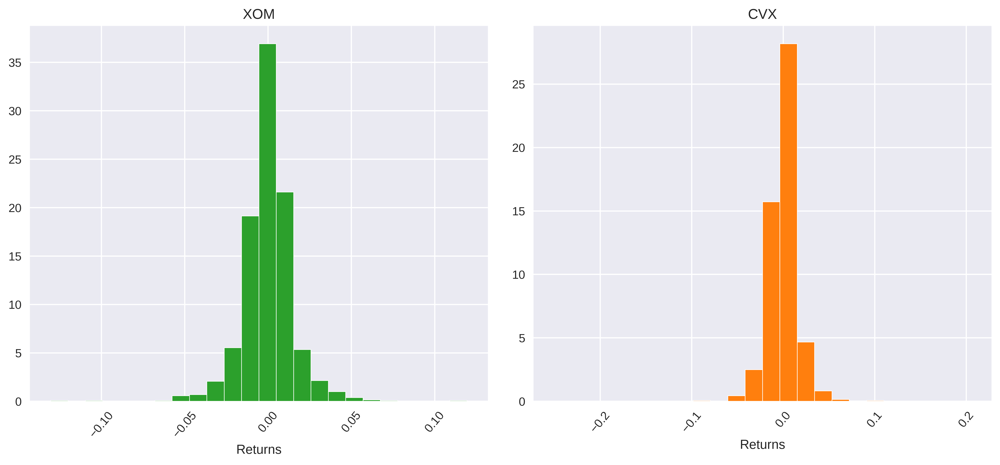

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))
fig.tight_layout(h_pad=3)

color_1 = 'tab:green'
color_2 = 'tab:orange'

axs[0].set(xlabel='Returns',
           title='XOM')
axs[0].hist(log_returns.loc[:, 'XOM'], color=color_1, bins=24, linewidth=0.5, edgecolor="white", density=True)
axs[0].tick_params(axis="x", rotation=50)
axs[1].set(xlabel='Returns', title='CVX')
axs[1].hist(log_returns.loc[:, 'CVX'], color=color_2, bins=24, linewidth=0.5,edgecolor="white", density=True)
axs[1].tick_params(axis="x", rotation=50)

plt.show()

## Relazioni tra i ritorni delle varie aziende

In [17]:
g = sns.PairGrid(log_returns)
g.map(sns.scatterplot);

Dall'immagine soprastante notiamo che i ritorni delle azioni nel settore energetico (**XOM** e **CVX**) non sono tanto dispersi e possono essere spiegati da una linea, quindi sono altamente correlati. Per quanto riguarda le azioni nel settore finanziario notiamo una correlazione lineare relativamente significativa, ma di ritorni a differenza del caso precedente risultano essere più dispersi.

Nel caso delle aziende tech notiamo subito che ritorni con le altre aziende risultano essere particolarmente dispersi e non è possibile affermare che esistano delle correlazioni tra i ritorni di queste e i ritorni delle altre aziende.

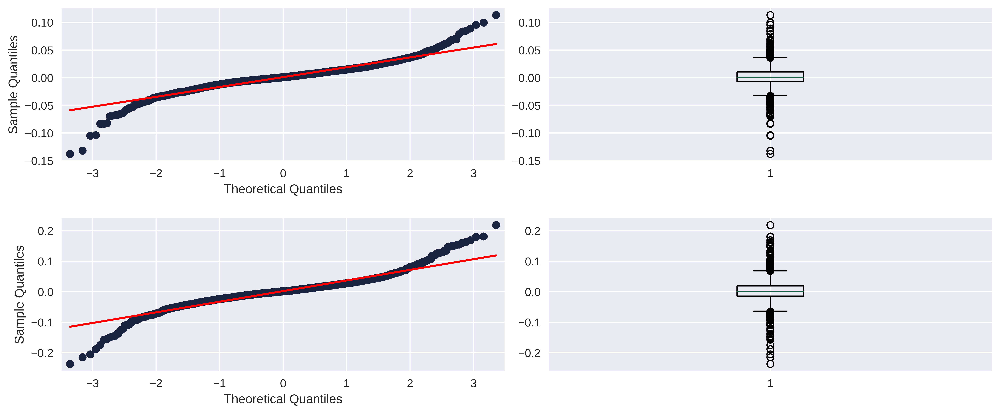

In [18]:
import statsmodels.api as sm

fig, axs = plt.subplots(2, 2, figsize=(12, 5))
fig.tight_layout(h_pad=3)

f = sm.qqplot(log_returns.loc[:, 'AAPL'], line = 's', ax=axs[0, 0])
axs[0, 1].boxplot(log_returns.loc[:, 'AAPL'])

f1 = sm.qqplot(log_returns.loc[:, 'TSLA'], line = 's', ax=axs[1, 0])
axs[1, 1].boxplot(log_returns.loc[:, 'TSLA'])

plt.show();

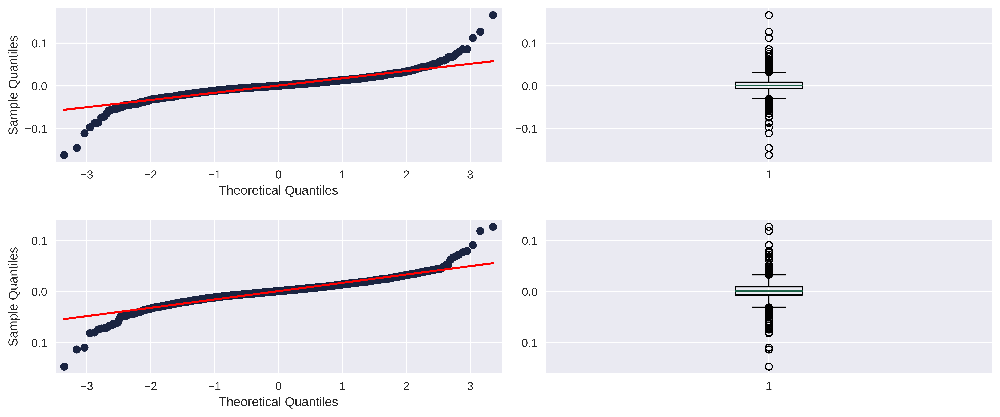

In [19]:
fig, axs = plt.subplots(2, 2, figsize=(12, 5))
fig.tight_layout(h_pad=3)

f = sm.qqplot(log_returns.loc[:, 'JPM'], line = 's', ax=axs[0, 0])
axs[0, 1].boxplot(log_returns.loc[:, 'JPM'])

f1 = sm.qqplot(log_returns.loc[:, 'BLK'], line = 's', ax=axs[1, 0])
axs[1, 1].boxplot(log_returns.loc[:, 'BLK'])

plt.show();

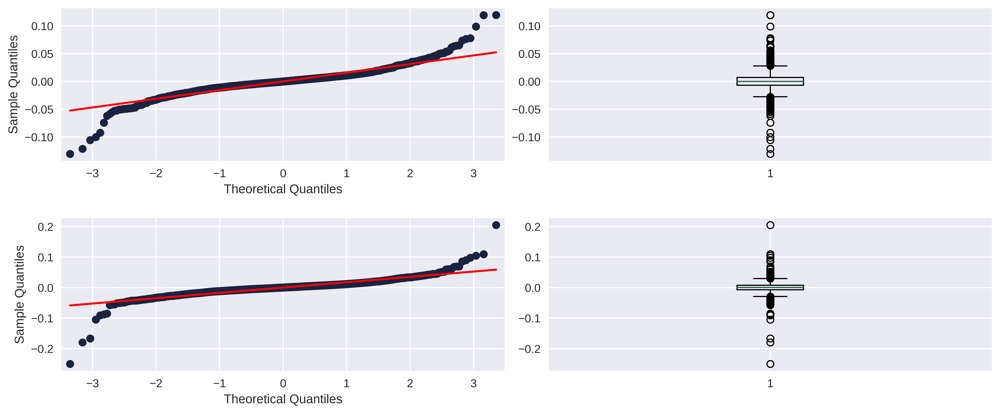

In [20]:
fig, axs = plt.subplots(2, 2, figsize=(12, 5))
fig.tight_layout(h_pad=3)

sm.qqplot(log_returns.loc[:, 'XOM'], line = 's', ax=axs[0, 0])
axs[0, 1].boxplot(log_returns.loc[:, 'XOM'])

sm.qqplot(log_returns.loc[:, 'CVX'], line = 's', ax=axs[1, 0])
axs[1, 1].boxplot(log_returns.loc[:, 'CVX'])

plt.show();

> TODO: commenta grafici soprastanti

## Statistiche univariate

In [21]:
pd.DataFrame(data={
    'mean':returns.mean(), 
    'std':returns.std(), 
    'skew':returns.skew(), 
    'kurtosis': returns.kurtosis()})

,mean,std,skew,kurtosis
Symbols,,,,
JPM,1.000903,0.016978,0.280468,14.256958
BLK,1.000896,0.016281,-0.132383,8.939199
XOM,1.000167,0.015620,0.140472,10.169543
CVX,1.000352,0.017367,-0.229122,31.089081
AAPL,1.001212,0.017812,-0.130092,6.492073
TSLA,1.002663,0.035009,0.415379,6.190262


Come ci si poteva aspettare i ritorni medi maggiori sono dati dalle aziende tech, ma ovviamente rendimenti alti vanno a braccietto con rischi alti, e questo lo si può notare andando vedere la deviazione standard di queste due aziende che risultano essere più alte della media (specialmente la devizione standard di **TSLA**).

La ***skewness*** (indice di simmetria) misura la simmetria della distribuzione sotto studio. Quindi un valore di skewness positivo sta ad indicare che la coda destra della distribuzione è più lunga; la massa della distribuzione è concentrata a sinistra della figura. l'opposto avviene quando il valore di skewness è negativo. 
Dai dati possiamo notare come le distribuzioni dei rendimenti di **JPM**, **XOM** e **TSLA** siano leggermente spostate più a destra (rendimenti positivi sono più probabili), mentre le distribuzioni dei rendimenti di **BLK**, **CVX** e **AAPL** siano leggermente spostate più a sinistra (rendimenti negativi sono più probabili).

La ***curtosi*** è uno degli indici relativi alla forma di una distribuzione, che costituisce una misura dello "spessore" delle code di una funzione di densità, ovvero il grado di "appiattimento" di una distribuzione. Un valore dell'indice pari a 0 significa che la distribuzione è corrispondente ad una distribuzione normale. Un valore minore di 0 indica una distribuzione platicurtica (distribuzione più sciacciata), mentre un valore maggiore di 0 indica una distribuzione leptocurtica (distribuzione più appuntita).
Dai dati notiamo che tutte le distribuzioni dei rendimenti possiedono un valore di kutosis maggiore di 0 e quindi possiamo affermare che le distribuzioni sono leptocurtiche.

## Correlazioni dei ritorni

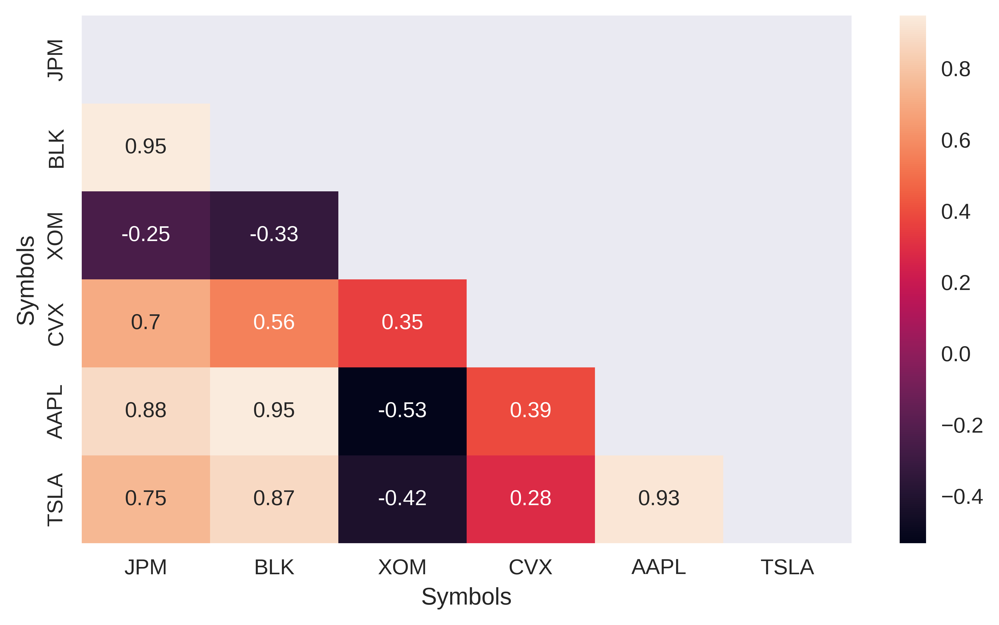

In [22]:
r_corr_matrix = stocks_df['Adj Close'].corr()

mask = np.zeros_like(r_corr_matrix)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(r_corr_matrix, annot=True, mask=mask);

Come possiamo notare i ritorni delle due aziende tech (**AAPL** e **TSLA**) e le due aziende in ambito finanziario possiedono un'altissima
correlazione, rispettivamente dello 0.93 e dello 0.95. Mentre una correlazione positiva significativa, cioè maggiore di 0.7, tra le aziende del settore
tech (growth companies) e del settore dei financial (considerato un settore value).

Mentre i ritorni delle aziende del settore energetico (**XOM** e **CVX**) non risultano avere una correlazione positiva significativa,
mentre in particolare XOM risulta essere correlata negativamente ai ritorni delle aziende finacial e del settore tech.

## Correlazione con gli ETF settoriali

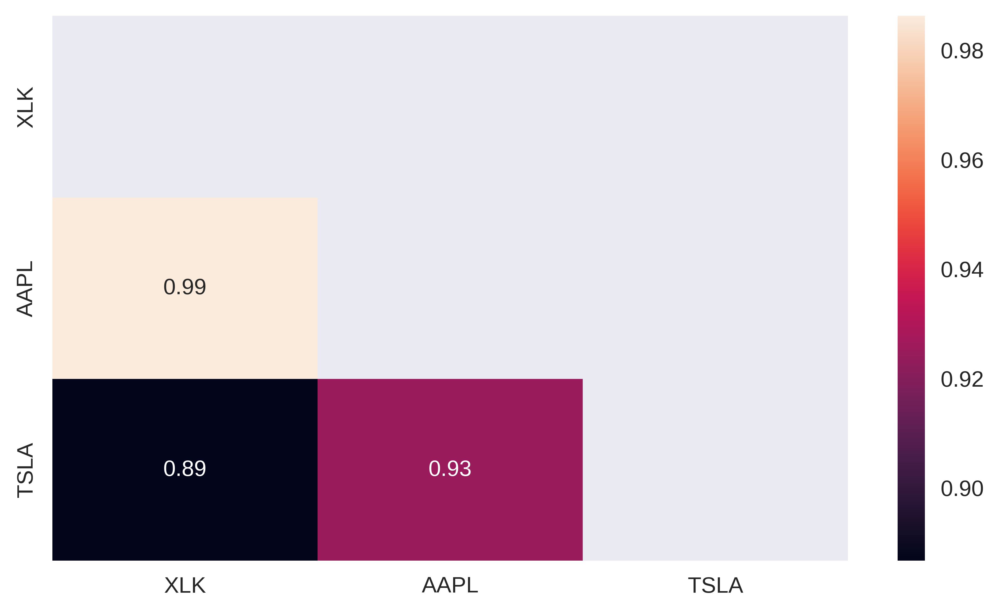

In [23]:
tech_df = pd.DataFrame(data={
    'XLK':xlk_df.close,
    'AAPL':stocks_df['Adj Close']['AAPL'],
    'TSLA':stocks_df['Adj Close']['TSLA']},
    index=xlk_df.index
)

tech_corr = tech_df.corr()

mask = np.zeros_like(tech_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(tech_corr, annot=True, mask=mask);

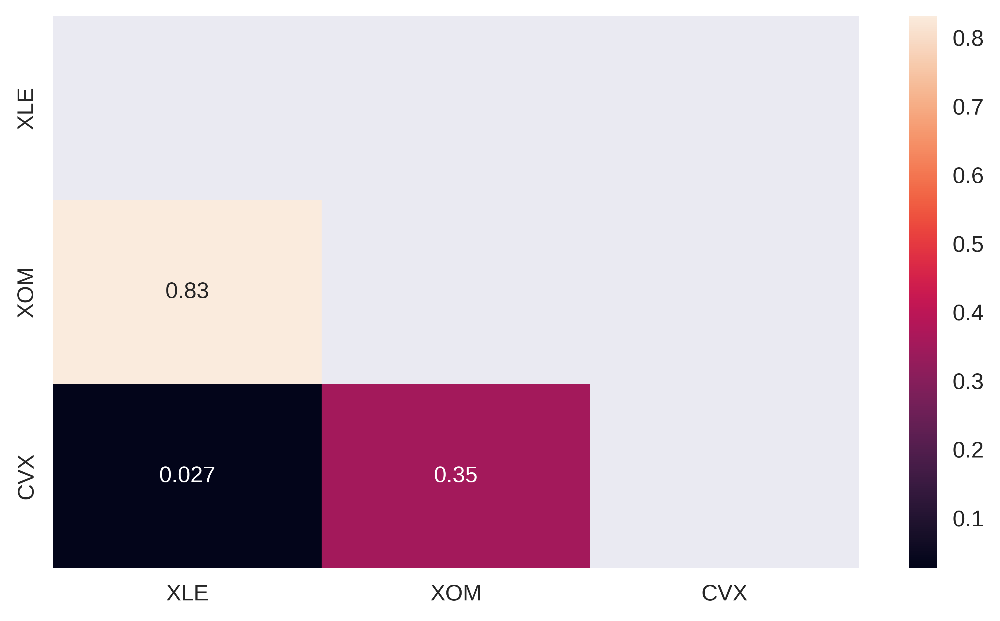

In [24]:
energy_df = pd.DataFrame(data={
    'XLE':xle_df.close,
    'XOM':stocks_df['Adj Close']['XOM'],
    'CVX':stocks_df['Adj Close']['CVX']},
    index=xlk_df.index
)

energy_corr = energy_df.corr()

mask = np.zeros_like(energy_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(energy_corr, annot=True, mask=mask);

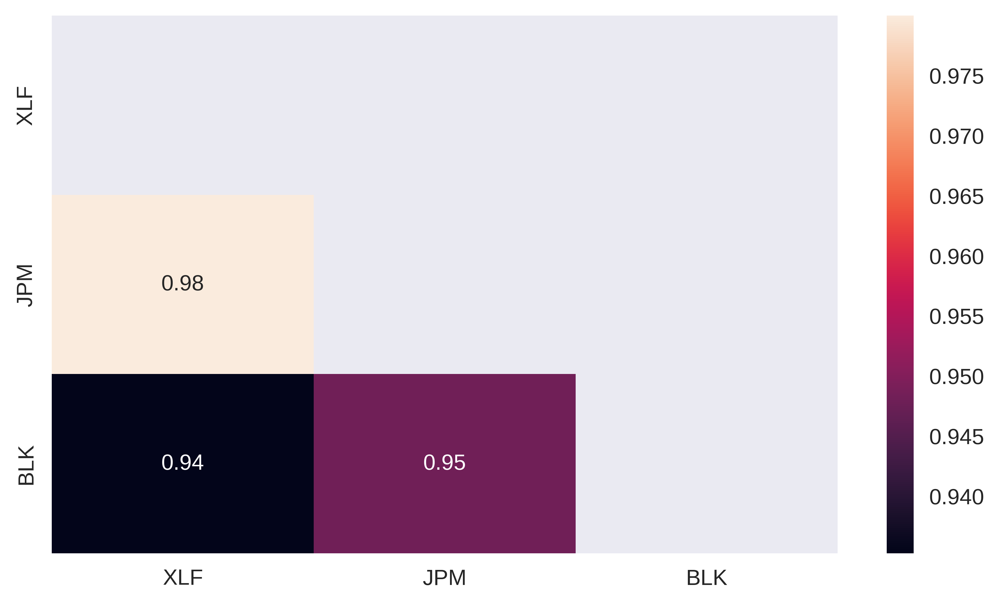

In [25]:
financial_df = pd.DataFrame(data={
    'XLF':xlf_df.close,
    'JPM':stocks_df['Adj Close']['JPM'],
    'BLK':stocks_df['Adj Close']['BLK']},
    index=xlk_df.index
)

fin_corr = financial_df.corr()

mask = np.zeros_like(fin_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(fin_corr, annot=True, mask=mask);

## Matrice correlazione tra ETF settoriali


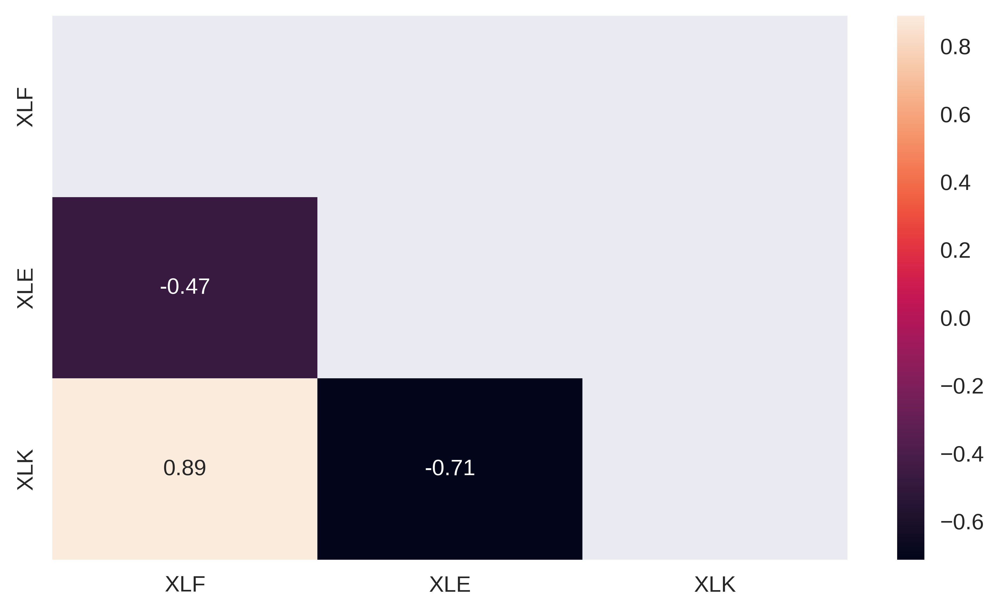

In [26]:
sectors_df = pd.DataFrame(data={
    'XLF':xlf_df.close,
    'XLE':xle_df.close,
    'XLK':xlk_df.close,},
    index=xlk_df.index
)

sectors_corr = sectors_df.corr()

mask = np.zeros_like(sectors_corr)
mask[np.triu_indices_from(mask)] = True

sns.heatmap(sectors_corr, annot=True, mask=mask);

## Matrice delle covarianze

La martice delle covarianze contiene nella diagonale le varianza delle varie azioni, mentre i valori al di fuori della
diagonale nell'$i$-iesima colonna e nella $j$-esima riga sono presenti le covarianze tra l'$i$-esima azione
e la $j$-esima azione.

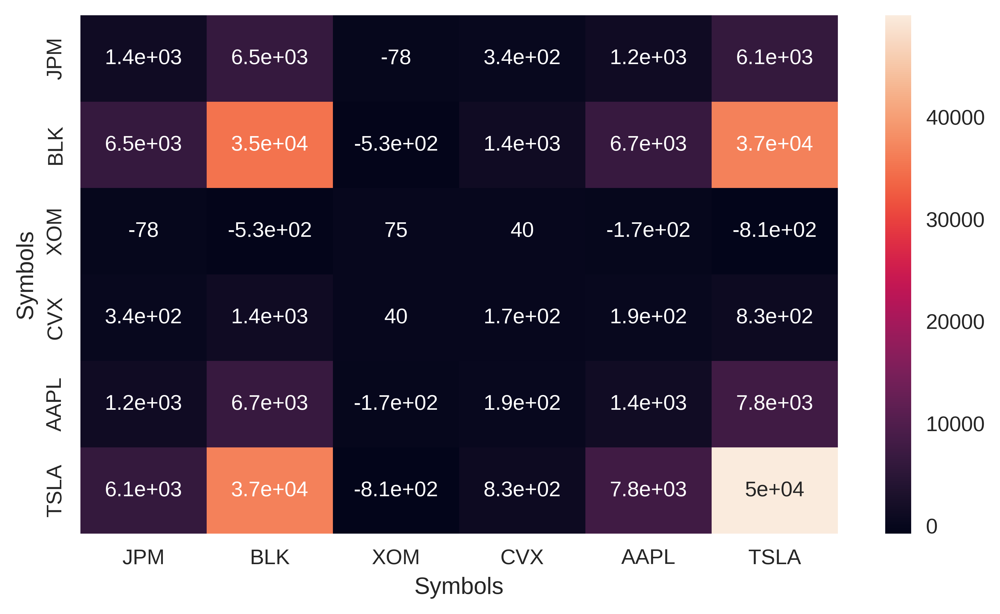

In [27]:
stocks_cov_matrix = stocks_df['Adj Close'].cov()

sns.heatmap(stocks_cov_matrix, annot=True);

Dalla matrice notiamo che le azioni più volatili sono **TSLA** (Tesla) e **BLK** (BlackRock), inoltre la covarianza tra queste due azioni è molto altra rispetto alle altre. Una covarianza alta tra due azioni differenti nella matrice significa che quando una varia tanto anche l'altra varierà tanto.

L'azione che invece possiede la varianza minore è **XOM**. Il che poteva essere prevedibile siccome le aziende nel settore energetico sono considerate aziende dal basso $\beta$, e quindi spesso hanno una minore volatilità.
In più si ha che la covarianza tra le aziende nel settore energetico è molto bassa, nonostante la varianza di **CVX** sia nettamente più alta delle varianza della compagna.


Verifichiamo se le conclusioni tratte da questa matrice possono essere confermate dalla matrice di
covarianza dei settori a cui appartengono tali azioni.

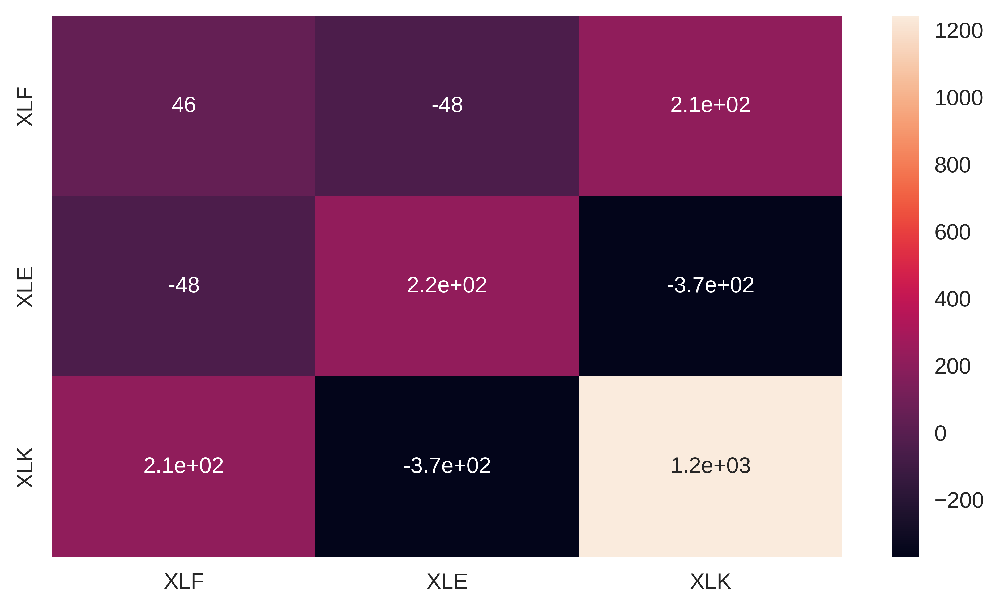

In [28]:
sns.heatmap(sectors_df.cov(), annot=True);

Notiamo subito che il settore più volatile, come ci si aspetta, è il settore delle aziende tecnologiche. Questo probabilitmente è dovuto al fatto che le aziende tech sono considerate aziende growth e quindi solitamente hanno un $\beta$ alto. La varinanza degli altri settori risulta essere di un ordini di grandezza inferiore rispetto alla varianza delle stocks, rispettivamente di 220 per il settore dei financial e di 46 per il settore degli energetici.
E' inoltre interessante notare come il settore dei financial abbia una volatilità minore del settore degli energetici.

Inaspettivamete l'eft settoriale con la varianza più bassa è **XLF**., nonstante le due aziende dei financial prese in considerazione non hanno una varianza così bassa.

> todo: scrivi qualcosa sulle covarianze e le relazioni con la matrice di covarianze soprastante

## Andamento delle correlazioni nel tempo



In [29]:
fig, axs = plt.subplots(2, 3, figsize=(16, 9))
fig.tight_layout(h_pad=6)

axs[0, 0].plot(log_returns['TSLA'].rolling(5).corr(log_returns['AAPL']).dropna()['2021'])
axs[0, 0].set_title('Weekly Rolling correlations')
axs[0, 0].set_xlabel('Date')
axs[0, 0].set_ylabel('Correlations')
axs[0, 0].tick_params(axis="x", rotation=50)

axs[0, 1].plot(log_returns['JPM'].rolling(5).corr(log_returns['BLK']).dropna()['2021'])
axs[0, 1].set_title('Weekly correlations')
axs[0, 1].set_xlabel('Date')
axs[0, 1].set_ylabel('Correlations')
axs[0, 1].tick_params(axis="x", rotation=50)

axs[0, 2].plot(log_returns['XOM'].rolling(5).corr(log_returns['CVX']).dropna()['2021'])
axs[0, 2].set_title('Weekly correlations')
axs[0, 2].set_xlabel('Date')
axs[0, 2].set_ylabel('Correlations')
axs[0, 2].tick_params(axis="x", rotation=50)


axs[1, 0].plot(log_returns['TSLA'].rolling(21).corr(log_returns['AAPL']).dropna()['2021'])
axs[1, 0].set_title('Monthly Rolling correlations')
axs[1, 0].set_xlabel('Date')
axs[1, 0].set_ylabel('Correlations')
axs[1, 0].tick_params(axis="x", rotation=50)

axs[1, 1].plot(log_returns['JPM'].rolling(21).corr(log_returns['BLK']).dropna()['2021'])
axs[1, 1].set_title('Monthly correlations')
axs[1, 1].set_xlabel('Date')
axs[1, 1].set_ylabel('Correlations')
axs[1, 1].tick_params(axis="x", rotation=50)

axs[1, 2].plot(log_returns['XOM'].rolling(21).corr(log_returns['CVX']).dropna()['2021'])
axs[1, 2].set_title('Monthly correlations')
axs[1, 2].set_xlabel('Date')
axs[1, 2].set_ylabel('Correlations')
axs[1, 2].tick_params(axis="x", rotation=50)

plt.show()

Dal grafico ci spicca all'occhio che le correlazioni mensili delle due azioni nel settore energetico sono
sempre maggiori 0.7. Quindi possiamo affermare che nell'ultimo anno le due aziende sono state positivamente correlate.
Questo è anche osservabile dalle correlazioni settimanali che risultano essere sempre vicine al 1.0, a parte di qualche
spike a ribasso.

Per le altre due coppie di aziende possiamo dire che sono state significativamente correlate positivamente
in alcuni mesi dell'anno: per le due aziende tecnologiche abbiamo che esse sono state correlate durante il periodo da febbraio
fino a marzo e durante il mese di settembre, mentre per le aziende nel settore finanziario le forti correlazioni si sono
avute durante i mesi si aprile-maggio, durante luglio e durante settembre.

# Modello di Previsione

In [212]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit
from sklearn.preprocessing import StandardScaler, Normalizer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline, FeatureUnion

## Feature Engineering

In [38]:
def get_single_stock(data, ticker):
    return pd.DataFrame(data={col[0]: data[col[0], ticker] for col in data.columns})

In [53]:
def ema(data, period=20, column = 'Adj Close'):
    data['EMA_' + str(period)] = data[column].ewm(span=period, adjust=False).mean()

def atr(data, period=14):
    df = data.copy()
    df['tr0'] = abs(df.High - df.Low)
    df['tr1'] = abs(df.High - df.Close.shift())
    df['tr2'] = abs(df.Low - df.Close.shift())
    tr = df[['tr0', 'tr1', 'tr2']].max(axis=1)
    data['ATR_' + str(period)] = tr.rolling(period).mean()
        
    
def rsi(data, period=14, column='Adj Close'):
    df = data.copy()
    delta = df[column].diff(1)
    delta = delta.dropna()
    up = delta.copy()
    down = delta.copy()
    up[up<0] = 0
    down[down>0] = 0
    df['up'] = up
    df['down'] = down
    AVG_Gain = df['up'].ewm(span=period, adjust=False).mean()
    AVG_Loss = abs(df['down'].ewm(span=period, adjust=False).mean())
    RS = AVG_Gain / AVG_Loss
    RSI = 100.0 - (100.0 / (1.0 + RS))
    data['RSI_' + str(period)] = RSI

def bb(data, period=20, column='Adj Close'):
    df = data.copy()
    df['SMA_20'] = df[column].rolling(period).mean()
    df['STD_20'] = df[column].rolling(period).std()
    data['BBU_' + str(period)] = df['SMA_20'] + 2 * df['STD_20']
    data['BBL_' + str(period)] = df['SMA_20'] - 2 * df['STD_20']

In [54]:
def add_cycical_features(df):
    df['date'] = df.index.copy()
    df['day_sin'] = df['date'].apply(lambda x : np.sin(x.day*(2.*np.pi/30)))
    df['day_cos'] = df['date'].apply(lambda x : np.cos(x.day*(2.*np.pi/30)))
    df['month_sin'] = df['date'].apply(lambda x : np.sin(x.month*(2.*np.pi/12)))
    df['month_cos'] = df['date'].apply(lambda x : np.cos(x.month*(2.*np.pi/12)))
    df = df.drop('date', axis=1)

In [187]:
X = stocks_df.copy()

In [188]:
stock_dfs = []

for stock in stocks:
    s_df = get_single_stock(X, stock)
    ema(s_df, 5)
    ema(s_df, 10)
    ema(s_df, 21)
    atr(s_df, 7)
    atr(s_df, 14)
    rsi(s_df, 7)
    rsi(s_df, 14)
    rsi(s_df, 21)
    bb(s_df, 20)
    
    add_cycical_features(s_df)
    s_df['Name'] = stock
    
    s_df.dropna(inplace=True)
    s_df['Target'] = np.where(s_df['Close'].shift(-1)> s_df['Close'], 1, 0)
    s_df.drop(['Adj Close', 'Close', 'Open', 'Low', 'High', 'Volume', 'date'], axis=1, inplace=True)
    s_df.reset_index(drop=True, inplace=True)
    
    stock_dfs.append(s_df)

In [189]:
X = pd.concat(stock_dfs)
X = pd.get_dummies(X, prefix='', prefix_sep='')
y = X['Target']
X.drop('Target', axis=1, inplace=True)

In [190]:
from sklearn.base import BaseEstimator, TransformerMixin

class ItemSelector(BaseEstimator, TransformerMixin):

    def __init__(self, columns):
        self.columns = columns

    def fit(self, x, y=None):
        return self

    def transform(self, data_array):
        return data_array.loc[:, self.columns]

In [191]:
norm_cols = ['EMA_5', 'EMA_10', 'EMA_21', 'ATR_7', 'ATR_14', 'RSI_7', 'RSI_14',
       'RSI_21', 'BBU_20', 'BBL_20']
no_norm_cols = ['day_sin', 'day_cos', 'month_sin', 'month_cos', 'AAPL', 'BLK', 
                'CVX', 'JPM', 'TSLA', 'XOM']
union = FeatureUnion([
    ('continous', Pipeline([  
            ('selector', ItemSelector(columns=norm_cols)),
            ('norm', Normalizer())
        ])),
    ('categorical', Pipeline([  
            ('selector', ItemSelector(columns=no_norm_cols))
        ]))
])

In [200]:
X = pd.DataFrame(union.fit_transform(X), columns=X.columns)

## Modello

In [214]:
base_classifier = DecisionTreeClassifier(
    max_depth=3, 
    min_samples_split=50,
)

model = AdaBoostClassifier(base_estimator=base_classifier,
                           n_estimators=150, 
                           random_state=0)

In [215]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8)

## Training

In [216]:
val_scores = []

i = 0

sss = StratifiedShuffleSplit(n_splits=20)

for train, val in sss.split(X_train, y_train):  
    model.fit(X_train.iloc[train, :], y_train.iloc[train])
    val_score = model.score(X_train.iloc[val, :], y_train.iloc[val])
    val_scores.append(val_score)

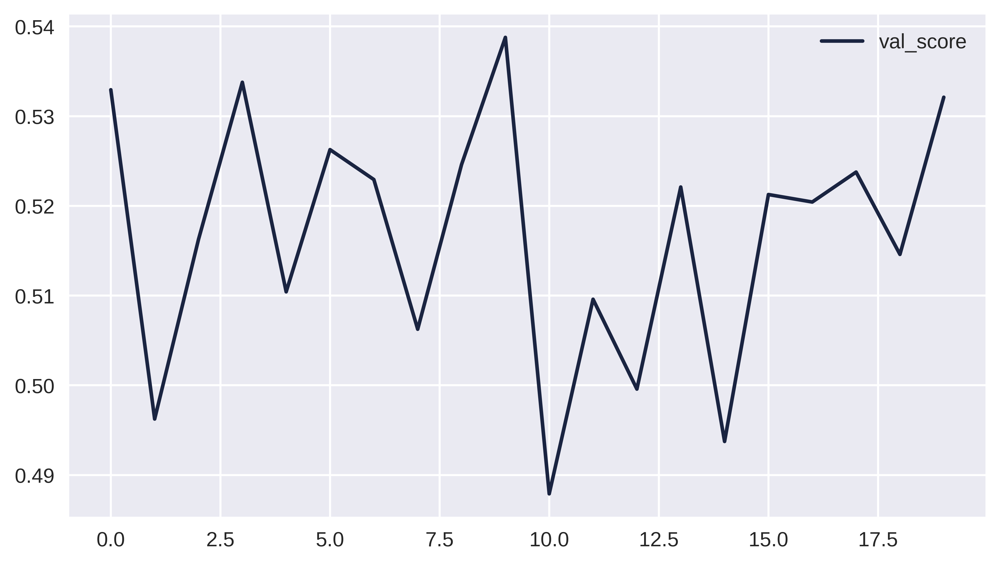

In [217]:
val_scores_df = pd.DataFrame(data={'val_score':val_scores})

val_scores_df.plot();

## Predizioni del Modello

In [218]:
model.score(X_test, y_test)

0.5003335557038026

In [219]:
idxs = X_test.loc[X_test['TSLA'] == 1, :][-10:].index

In [221]:
accuracies = {stock: 0 for stock in stocks}

for stock in stocks:
    idxs = X_test.loc[X_test[stock] == 1, :][-30:].index
    count = 0

    for p, r in zip(model.predict(X.iloc[idxs]), y.iloc[idxs]):
        if p == r:
            count += 1 
    
    accuracies[stock] = count / len(idxs)

In [222]:
print(accuracies)

{'JPM': 0.6666666666666666, 'BLK': 0.4, 'XOM': 0.3333333333333333, 'CVX': 0.4666666666666667, 'AAPL': 0.36666666666666664, 'TSLA': 0.5666666666666667}


# Strategia di Trading

# CAPM

## Calcolo del $\beta$

In [261]:
sp500_df = web.get_data_yahoo('^GSPC', start = start_date, end = end_date)

In [274]:
betas = {stock: 0 for stock in stocks}

for stock in stocks:
    s_df = get_single_stock(stocks_df, stock)
    risky_asset = s_df['Adj Close'].resample('M').last().pct_change().dropna()
    market = sp500_df['Adj Close'].resample('M').last().pct_change().dropna()
    betas[stock] = np.cov(risky_asset.values, market.values)[0,1] / market.values.var()

In [275]:
betas

{'JPM': 1.2751365134236279,
 'BLK': 1.355007265776476,
 'XOM': 1.226800924212091,
 'CVX': 1.2616569980635222,
 'AAPL': 1.2483131890698422,
 'TSLA': 1.8292348538914232}

Considerazioni sul $\beta$

## Esposizione ai fattori di rischio Fama-French

In [311]:
ff_factors = pd.read_csv('./data/F-F_Research_Data_Factors.CSV', sep=',', parse_dates=True)
ff_factors['Date'] = pd.to_datetime(ff_factors['Date'], format='%Y%m').dt.strftime("%Y-%m")
ff_factors.set_index('Date', inplace=True)
ff_factors

,mkt,smb,hml,rf
date,,,,
1926-07,2.96,-2.38,-2.73,0.22
1926-08,2.64,-1.47,4.14,0.25
1926-09,0.36,-1.39,0.12,0.23
1926-10,-3.24,-0.13,0.65,0.32
1926-11,2.53,-0.16,-0.38,0.31
...,...,...,...,...
2021-06,2.75,1.80,-7.76,0.00
2021-07,1.27,-3.96,-1.75,0.00
2021-08,2.90,-0.48,-0.13,0.00


In [319]:
ff_factors = ff_factors['2011-12':'2021-10']

In [320]:
ff_factors

,mkt,smb,hml,rf
date,,,,
2011-12,0.74,-0.60,1.61,0.0
2012-01,5.05,2.06,-0.94,0.0
2012-02,4.42,-1.86,0.43,0.0
2012-03,3.11,-0.66,1.12,0.0
2012-04,-0.85,-0.41,-0.77,0.0
...,...,...,...,...
2021-06,2.75,1.80,-7.76,0.0
2021-07,1.27,-3.96,-1.75,0.0
2021-08,2.90,-0.48,-0.13,0.0


In [351]:
import statsmodels.formula.api as smf

params = ['Intercept', 'mkt', 'smb', 'hml']
stocks_factors = {p:[] for p in params}

for s in stocks:
    s_df = get_single_stock(stocks_df, s)
    ff_data = ff_factors.copy()
    y = s_df['Adj Close'].resample('M').last().pct_change().dropna()
    y.index = y.index.strftime('%Y-%m')
    y = y['2011-12': '2021-10']
    y.name = 'rtn'
    ff_data = ff_data.join(y)
    ff_data['excess_rtn'] = ff_data.rtn - ff_data.rf
    ff_model = smf.ols(formula = 'excess_rtn ~ mkt + smb + hml', data = ff_data).fit()
    for p in params:
        stocks_factors[p].append(ff_model.params[p])

In [352]:
stocks_factors_df = pd.DataFrame(stocks_factors, index=stocks)
stocks_factors_df

,Intercept,mkt,smb,hml
JPM,-0.040740,0.013025,0.002121,0.013747
BLK,-0.045400,0.014830,0.000406,0.005698
XOM,-0.055588,0.012129,0.005905,0.011091
CVX,-0.053572,0.012811,0.003616,0.011313
AAPL,-0.041784,0.015259,-0.002160,-0.003759
TSLA,-0.016066,0.020854,0.004747,-0.004680


Commenta tabella

# Portfolio Selection

In [365]:
n_days = 252
n_port = 10 ** 5
n_assets = len(stocks)
avg_returns = returns.mean() * n_days
cov_mat = returns.cov() * n_days

In [366]:
np.random.seed(0)
weights = np.random.random(size=(n_port, n_assets))
weights /=  np.sum(weights, axis=1)[:, np.newaxis]

In [367]:
portf_rtns = np.dot(weights, avg_returns)

portf_vol = []
for i in range(0, len(weights)):
    portf_vol.append(np.sqrt(np.dot(weights[i].T, 
                                    np.dot(cov_mat, weights[i]))))
portf_vol = np.array(portf_vol)  
portf_sharpe_ratio = portf_rtns / portf_vol

In [368]:
portf_results_df = pd.DataFrame({'returns': portf_rtns,
                                 'volatility': portf_vol,
                                 'sharpe_ratio': portf_sharpe_ratio})

In [369]:
n_points = 100
portf_vol_ef = []
indices_to_skip = []

portf_rtns_ef = np.linspace(portf_results_df.returns.min(), 
                            portf_results_df.returns.max(), 
                           n_points)
portf_rtns_ef = np.round(portf_rtns_ef, 2)    
portf_rtns = np.round(portf_rtns, 2)

for point_index in range(n_points):
    if portf_rtns_ef[point_index] not in portf_rtns:
        indices_to_skip.append(point_index)
        continue
    matched_ind = np.where(portf_rtns == portf_rtns_ef[point_index])
    portf_vol_ef.append(np.min(portf_vol[matched_ind]))
    
portf_rtns_ef = np.delete(portf_rtns_ef, indices_to_skip)

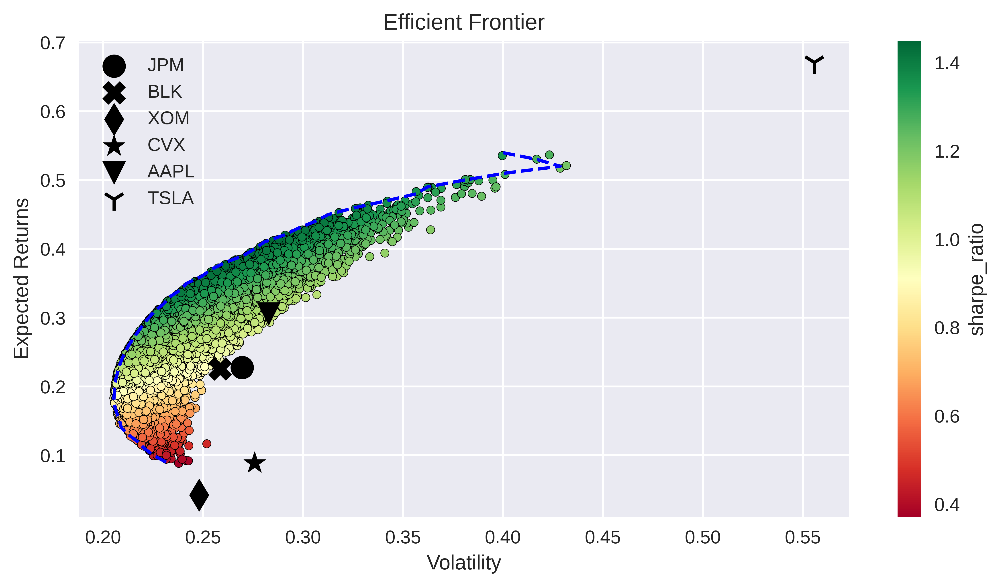

In [372]:
MARKS = ['o', 'X', 'd', '*', 'v', '1']

fig, ax = plt.subplots()
portf_results_df.plot(kind='scatter', x='volatility', 
                      y='returns', c='sharpe_ratio',
                      cmap='RdYlGn', edgecolors='black', 
                      ax=ax)
ax.set(xlabel='Volatility', 
       ylabel='Expected Returns', 
       title='Efficient Frontier')
ax.plot(portf_vol_ef, portf_rtns_ef, 'b--')
for asset_index in range(n_assets):
    ax.scatter(x=np.sqrt(cov_mat.iloc[asset_index, asset_index]), 
                y=avg_returns[asset_index], 
                marker=MARKS[asset_index], 
                s=150, 
                color='black',
                label=stocks[asset_index])
ax.legend()

plt.tight_layout()
plt.show()